# Explore the dataset


In this notebook, we will perform an EDA (Exploratory Data Analysis) on the processed Waymo dataset (data in the `processed` folder). In the first part, you will create a function to display 

In [1]:
from utils import get_dataset
import glob
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import numpy as np
import tensorflow as tf


In [5]:
# I'm using here the preprocessed data that I downloaded from the workspace since I cannot get waymo-open-dataset working on Windows 
# and therefore cannot process the files myself
dataset = get_dataset("data/train/*.tfrecord")


INFO:tensorflow:Reading unweighted datasets: ['data/train/*.tfrecord']
INFO:tensorflow:Reading record datasets for input file: ['data/train/*.tfrecord']
INFO:tensorflow:Number of filenames to read: 86
Instructions for updating:
Use `tf.data.Dataset.interleave(map_func, cycle_length, block_length, num_parallel_calls=tf.data.AUTOTUNE)` instead. If sloppy execution is desired, use `tf.data.Options.deterministic`.
Instructions for updating:
Use `tf.data.Dataset.map()


## Write a function to display an image and the bounding boxes

Implement the `display_instances` function below. This function takes a batch as an input and display an image with its corresponding bounding boxes. The only requirement is that the classes should be color coded (eg, vehicles in red, pedestrians in blue, cyclist in green).

In [6]:
def display_instances(batch):
    """
    This function takes a batch from the dataset and display the image with 
    the associated bounding boxes.
    """
    # put TF dataset value to numpy arrays for better handling
    images = batch['image'].numpy()
    bboxes = batch['groundtruth_boxes'].numpy()
    classes = batch['groundtruth_classes'].numpy()

    # color mapping of classes
    colormap = {1: [1, 0, 0], 2: [0, 1, 0], 4: [0, 0, 1]}

    # bounding box coordinates are normalized to 0-1 so we need to calculate the coordinates by multiplying with image dimensions
    w,h, _ = images.shape
    bboxes[:, [1,3]] = bboxes[:, [1,3]]*w
    bboxes[:, [0,2]] = bboxes[:, [0,2]]*h

    # create the plot for showing image and boxes
    f, ax = plt.subplots(1, figsize=(10, 10))
    ax.imshow(images.astype(np.uint8))
    for bb, cl in zip(bboxes, classes):
        y1, x1, y2, x2 = bb
        rec = Rectangle((x1, y1), x2-x1, y2-y1, facecolor='none', edgecolor=colormap[cl], linewidth=2)
        ax.add_patch(rec)

    plt.show()


## Display 10 images 

Using the dataset created in the second cell and the function you just coded, display 10 random images with the associated bounding boxes. You can use the methods `take` and `shuffle` on the dataset.

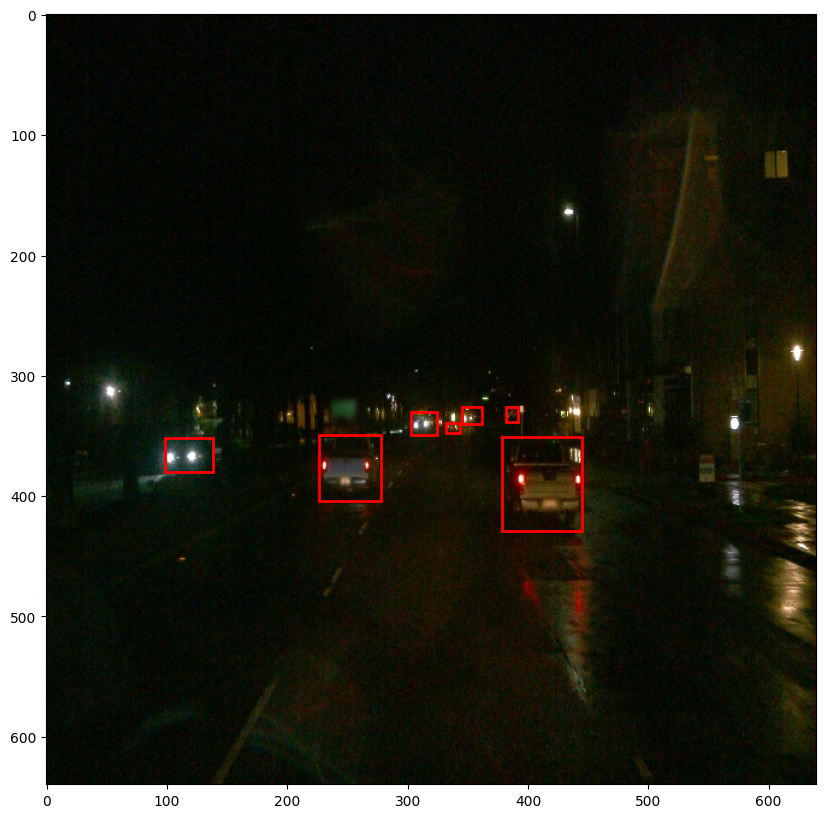

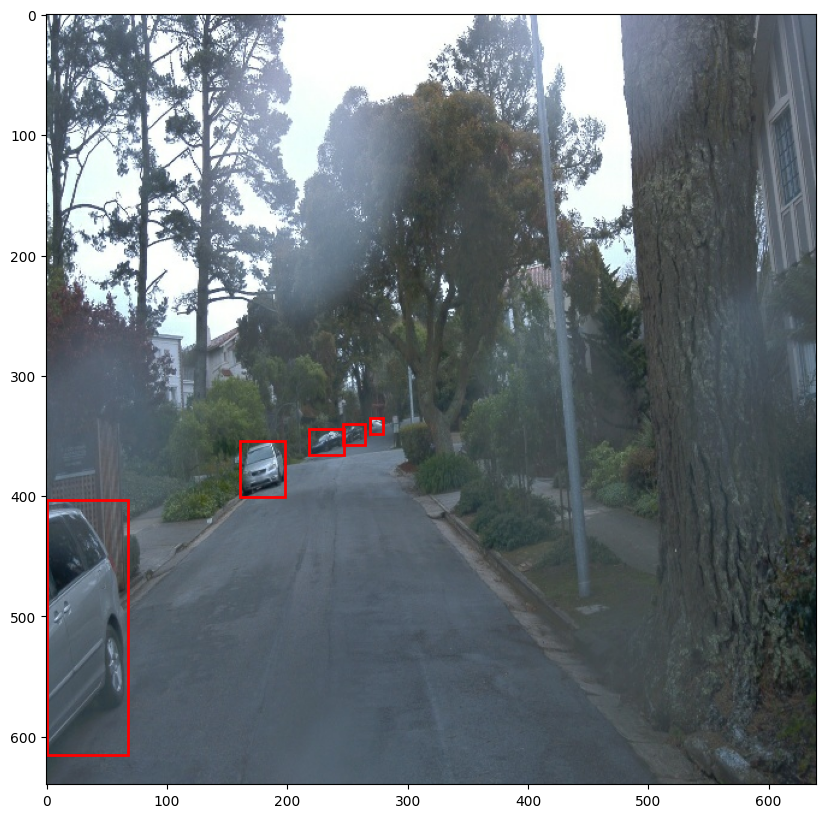

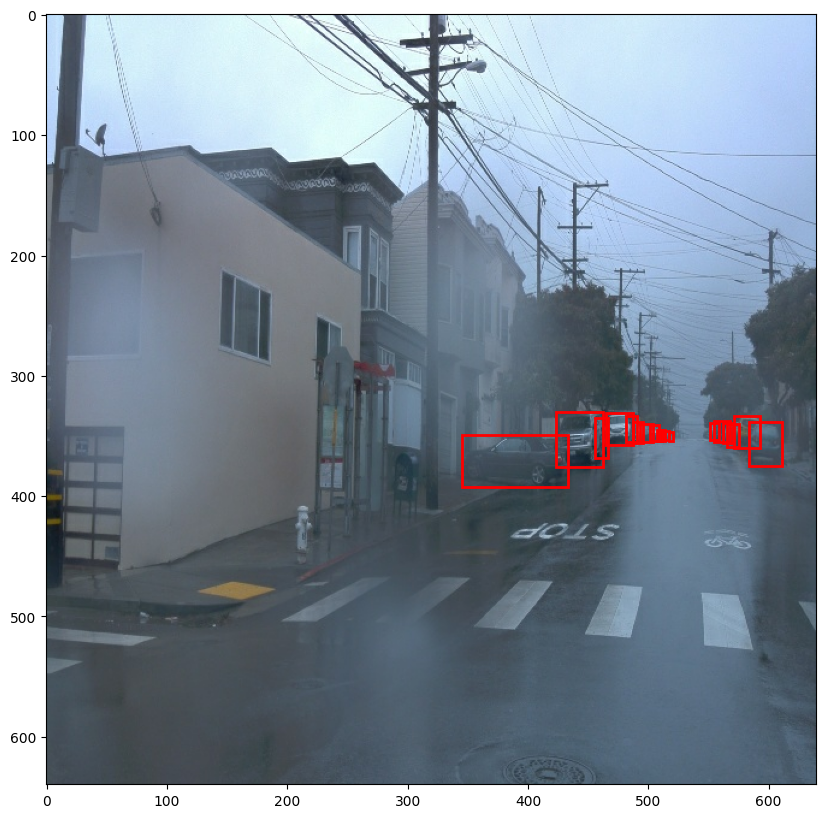

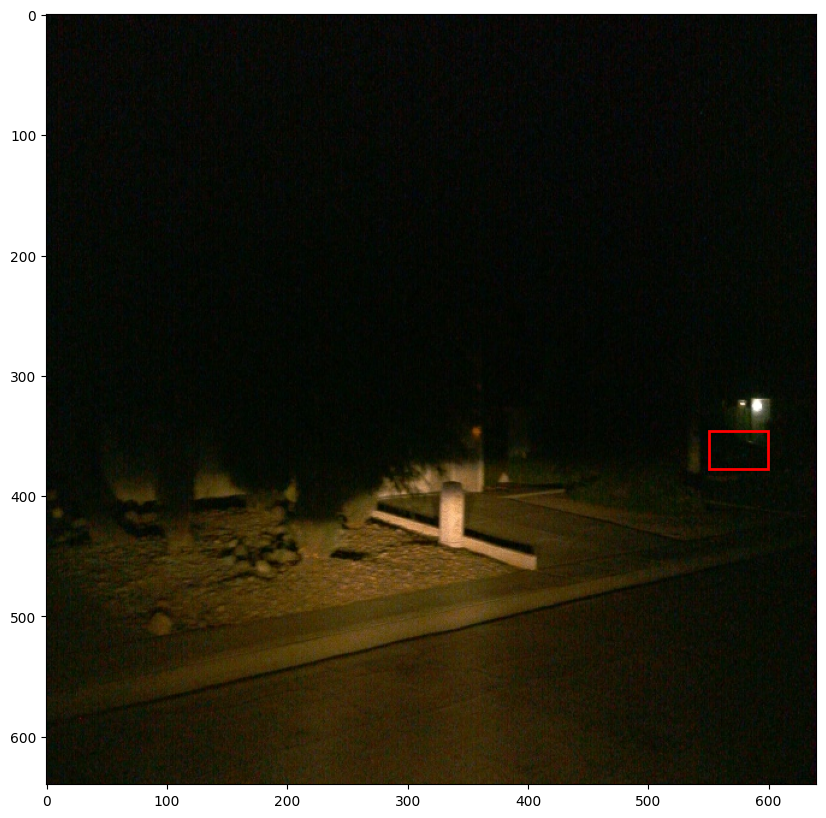

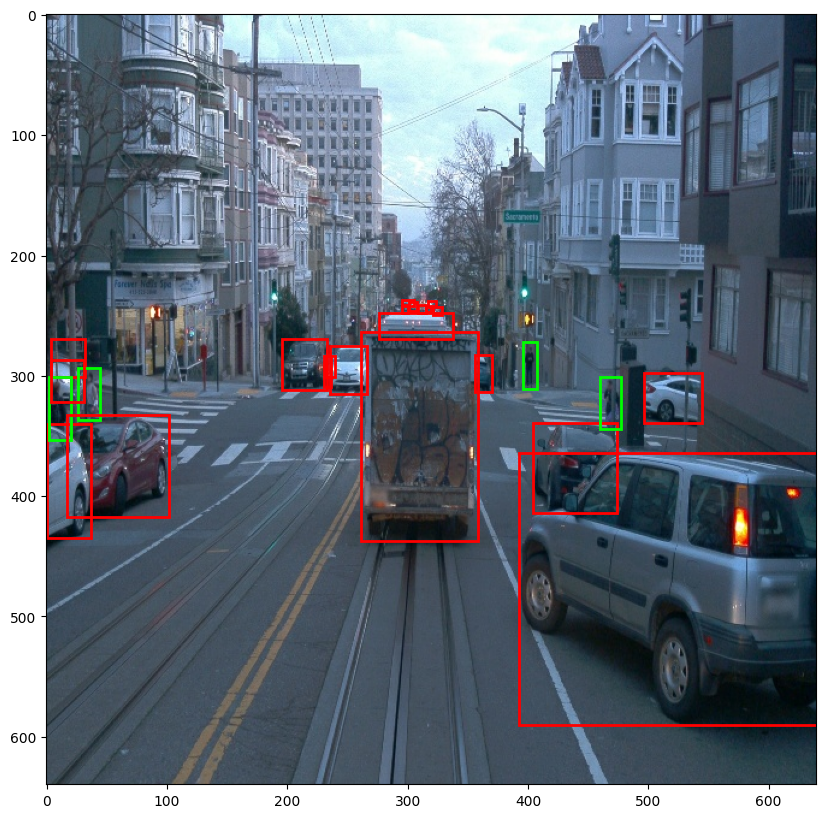

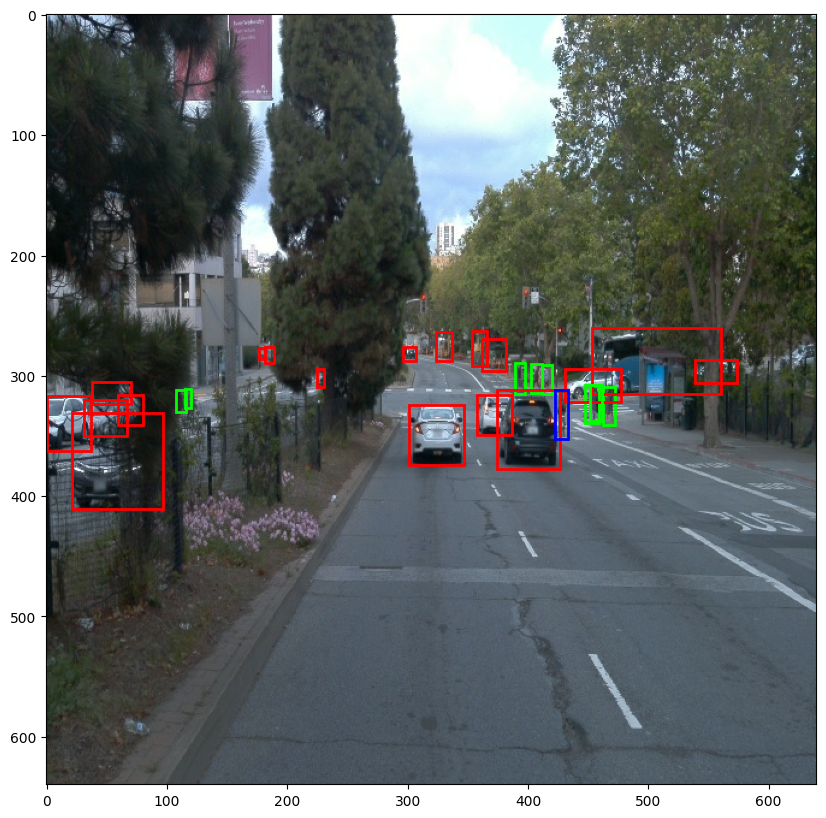

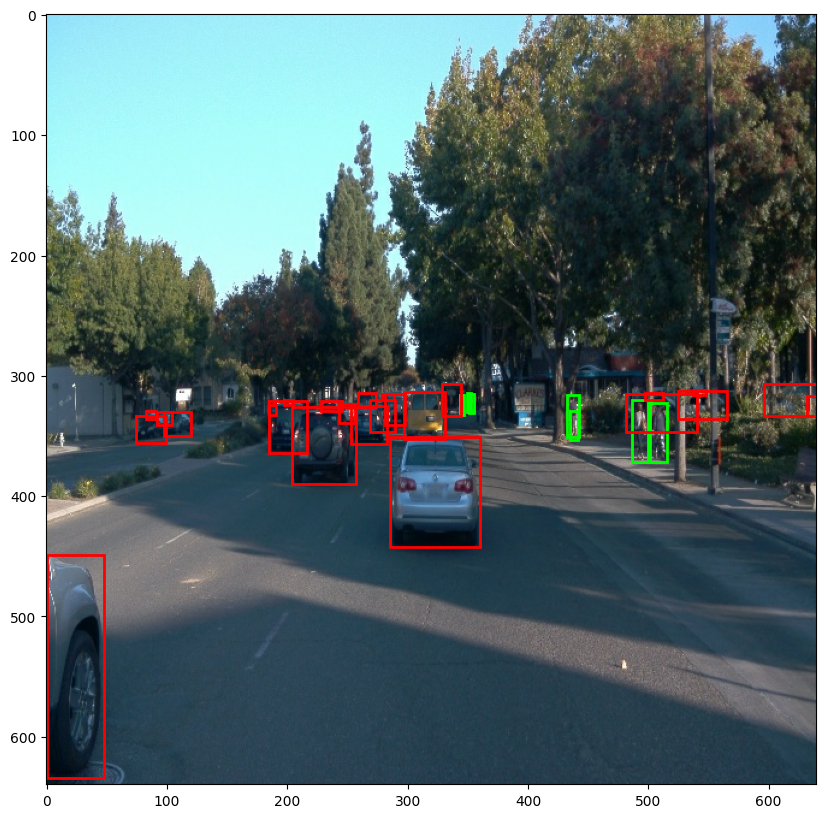

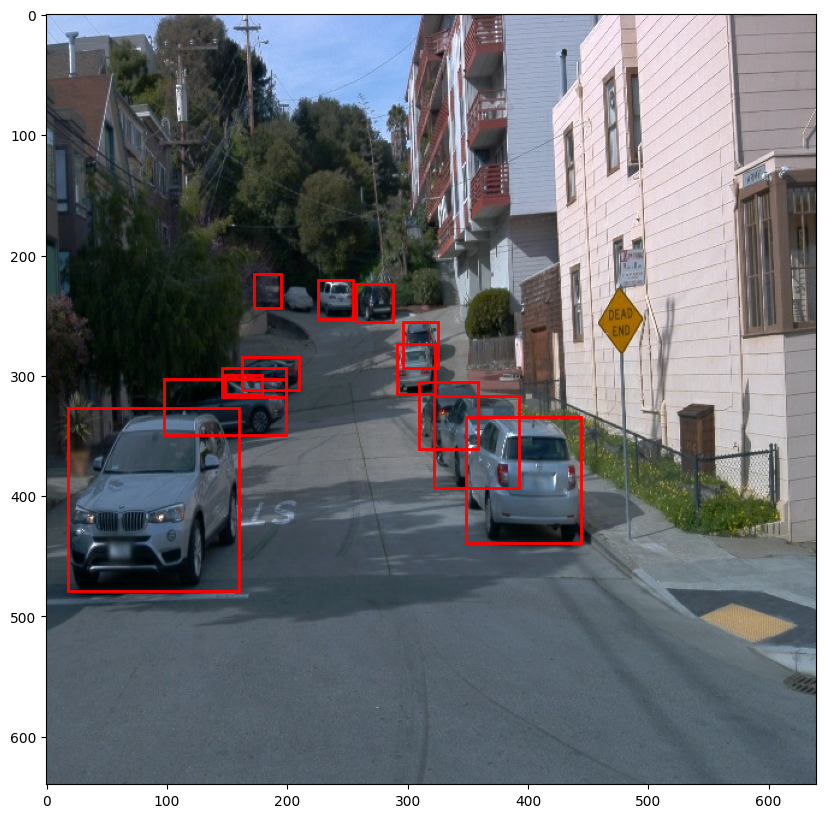

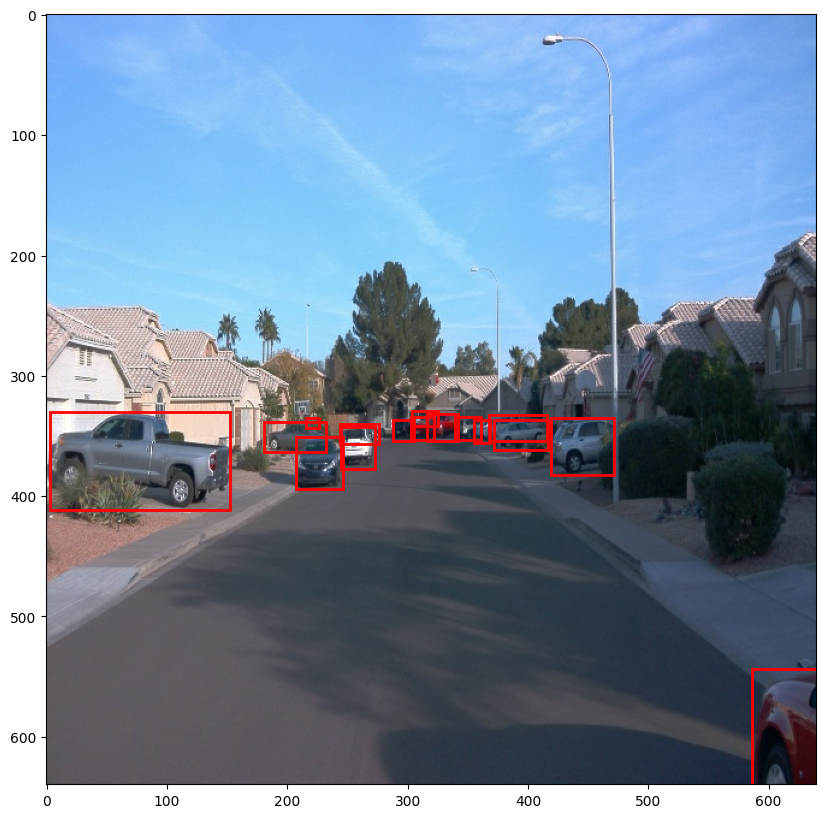

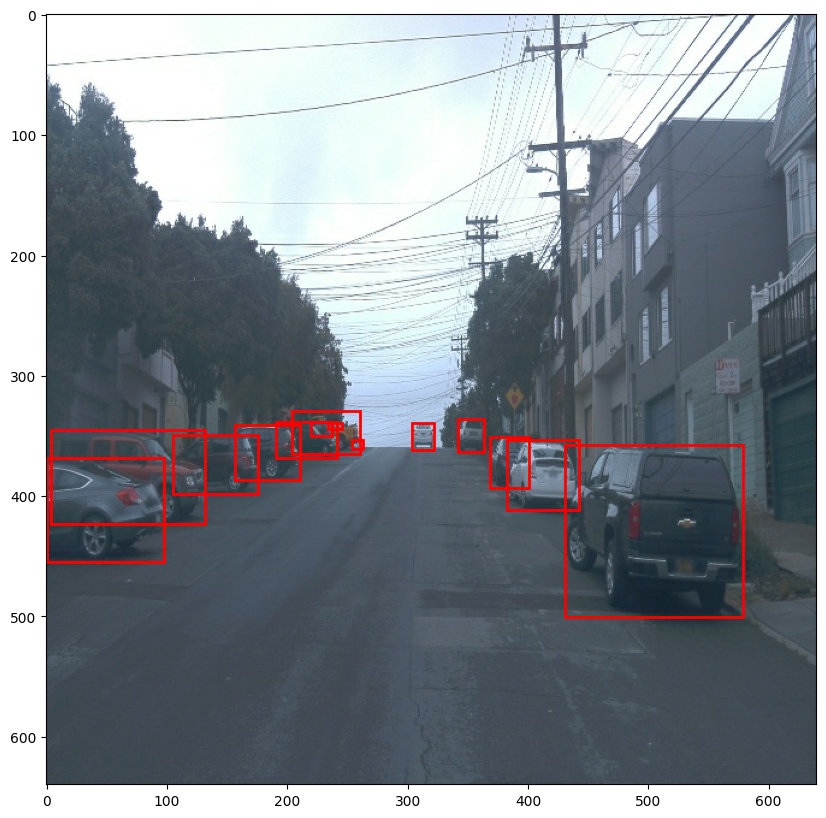

In [7]:
## STUDENT SOLUTION HERE
%matplotlib inline
dataset = dataset.shuffle(100, reshuffle_each_iteration=True)
for batch in dataset.take(10):
    display_instances(batch)
        

## Additional EDA

In this last part, you are free to perform any additional analysis of the dataset. What else would like to know about the data?
For example, think about data distribution. So far, you have only looked at a single file...

In [9]:
#Not many cyclists, that's for sure... let's have a look
classes_total = []

for batch in dataset.take(10000):
    classes = batch['groundtruth_classes'].numpy()
    classes_total = np.append(classes_total, classes)
print("Class occurrence in sample(n=10000):\n1=vehicle, 2=pedestrian, 4=cyclist" )

#Calculate amounts of each class and the total amount and percentage
unique, counts = np.unique(classes_total, return_counts=True)
total=sum(counts)
print(dict(zip(unique,counts)))
percentage = counts/total*100

#Create pie graph of percentage split
labels= 'Vehicle', 'Pedestrian', 'Cyclist'
plt.pie(percentage, labels=labels)
plt.show()

#Check that Cyclist is not null
if counts.shape[0] == 3:
    print("\nCyclist appear {} times out of {} total".format(counts[2],total))
else:
    print("\nNo cyclists appeared out of {} total".format(total))

SyntaxError: positional argument follows keyword argument (2584629935.py, line 16)